In [1]:
from tensorflow import keras
from tensorflow.keras import layers
import pathlib
from tensorflow.keras.utils import image_dataset_from_directory

import pandas as pd
import pathlib
from pathlib import Path

import numpy as np
import pandas as pd

# plotting modules
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import plotly as plotly
plotly.offline.init_notebook_mode()

from tensorflow import keras
from tensorflow.keras import layers

import tensorflow as tf
from keras.utils import to_categorical
from keras.models import load_model

import plotly.graph_objects as go
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dense
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_curve, ConfusionMatrixDisplay

In [183]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [184]:
# turn off gpu logging
tf.debugging.set_log_device_placement(False)

# Framing the Problem

### Fetching Dataset from multiple sources

In [185]:
data_folder = pathlib.Path("../../../../../Downloads/hispathology")

In [2]:
data_folder = pathlib.Path("./Downloads/Datasets")

In [ ]:
# Histogram
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.histplot(data, kde=True)
plt.title('Histogram')

# Q-Q Plot
plt.subplot(1, 2, 2)
stats.probplot(data, dist="norm", plot=plt)
plt.title('Q-Q Plot')
plt.show()

In [186]:
len(list(data_folder.glob('*')))

280

In [187]:
list(data_folder.glob('*'))[:10]

[WindowsPath('../../../../../Downloads/hispathology/10253'),
 WindowsPath('../../../../../Downloads/hispathology/10254'),
 WindowsPath('../../../../../Downloads/hispathology/10255'),
 WindowsPath('../../../../../Downloads/hispathology/10256'),
 WindowsPath('../../../../../Downloads/hispathology/10257'),
 WindowsPath('../../../../../Downloads/hispathology/10258'),
 WindowsPath('../../../../../Downloads/hispathology/10259'),
 WindowsPath('../../../../../Downloads/hispathology/10260'),
 WindowsPath('../../../../../Downloads/hispathology/10261'),
 WindowsPath('../../../../../Downloads/hispathology/10262')]

In [188]:
patient_data_folder = data_folder / 'IDC_regular_ps50_idx5'

In [189]:
len(list(patient_data_folder.glob('*')))

279

In [190]:
patient_folders = [x for x in patient_data_folder.glob('*') if x.is_dir()]
patient_folders = [x.name for x in patient_folders]
patient_folders[:10]

['10253',
 '10254',
 '10255',
 '10256',
 '10257',
 '10258',
 '10259',
 '10260',
 '10261',
 '10262']

In [191]:
total_images = 0
for patient_folder in patient_folders:
    patient_folder_path = patient_data_folder / patient_folder
    subfolders = ['0', '1']  # List of subfolders you're interested in
    for subfolder in subfolders:
        subfolder_path = patient_folder_path / subfolder
        images = list(subfolder_path.glob('*'))
        total_images += len(images)
        print(f'Patient folder {patient_folder}/{subfolder} contains {len(images)} images.')


Patient folder 10253/0 contains 479 images.
Patient folder 10253/1 contains 70 images.
Patient folder 10254/0 contains 772 images.
Patient folder 10254/1 contains 76 images.
Patient folder 10255/0 contains 181 images.
Patient folder 10255/1 contains 91 images.
Patient folder 10256/0 contains 351 images.
Patient folder 10256/1 contains 117 images.
Patient folder 10257/0 contains 427 images.
Patient folder 10257/1 contains 208 images.
Patient folder 10258/0 contains 422 images.
Patient folder 10258/1 contains 108 images.
Patient folder 10259/0 contains 1434 images.
Patient folder 10259/1 contains 31 images.
Patient folder 10260/0 contains 928 images.
Patient folder 10260/1 contains 361 images.
Patient folder 10261/0 contains 590 images.
Patient folder 10261/1 contains 56 images.
Patient folder 10262/0 contains 1053 images.
Patient folder 10262/1 contains 754 images.
Patient folder 10264/0 contains 617 images.
Patient folder 10264/1 contains 587 images.
Patient folder 10268/0 contains 208

Patient folder 9255/0 contains 838 images.
Patient folder 9255/1 contains 388 images.
Patient folder 9256/0 contains 489 images.
Patient folder 9256/1 contains 442 images.
Patient folder 9257/0 contains 1001 images.
Patient folder 9257/1 contains 201 images.
Patient folder 9258/0 contains 264 images.
Patient folder 9258/1 contains 334 images.
Patient folder 9259/0 contains 1174 images.
Patient folder 9259/1 contains 225 images.
Patient folder 9260/0 contains 236 images.
Patient folder 9260/1 contains 126 images.
Patient folder 9261/0 contains 521 images.
Patient folder 9261/1 contains 446 images.
Patient folder 9262/0 contains 14 images.
Patient folder 9262/1 contains 80 images.
Patient folder 9265/0 contains 1636 images.
Patient folder 9265/1 contains 41 images.
Patient folder 9266/0 contains 1119 images.
Patient folder 9266/1 contains 52 images.
Patient folder 9267/0 contains 337 images.
Patient folder 9267/1 contains 321 images.
Patient folder 9290/0 contains 1368 images.
Patient fo

In [192]:
print(f'Total number of images in all subfolders is {total_images}.')

Total number of images in all subfolders is 277524.


In [193]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.image import imread  # or from PIL import Image if you prefer


In [194]:

patient_folders = os.listdir(patient_data_folder)  # List of patient folder names

# Initialize an empty list to collect data
data_list = []

# Iterate over patient folders and their subfolders
for patient_id in patient_folders:
    patient_path = patient_data_folder / patient_id
    for target in ['0', '1']:
        class_path = patient_path / target
        image_files = os.listdir(class_path)
        for image_file in image_files:
            image_path = class_path / image_file
            # Append a new dict to the list
            data_list.append({
                "patient_id": patient_id,
                "path": str(image_path),
                "target": int(target)
            })

# Create the DataFrame from the list of dicts
dataset = pd.DataFrame(data_list)

dataset.head()

,patient_id,path,target
0,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
1,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
2,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
3,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
4,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0


In [195]:
dataset.shape

(277524, 3)

# EDA

In [196]:
dataset.target.value_counts()

target
0    198738
1     78786
Name: count, dtype: int64

In [197]:
import plotly.graph_objects as go

# Calculate the percentage of cancerous patches for each patient
cancer_perc = dataset.groupby("patient_id")['target'].value_counts(normalize=True).unstack()

# Number of patches per patient
patches_per_patient = dataset.groupby("patient_id").size()

# Plot 1: Histogram of the number of patches per patient
fig1 = go.Figure(go.Histogram(x=patches_per_patient, nbinsx=30, marker_color="steelblue"))
fig1.update_layout(title_text="How many patches do we have per patient?", xaxis_title="Number of Patches", yaxis_title="Frequency", height=600, width=800)
fig1.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig1.show()

# Plot 2: Histogram of the percentage of cancerous patches per patient
# Ensure there is a '1' column for cancerous patches; if not, create it with 0 values
if 1 not in cancer_perc.columns:
    cancer_perc[1] = 0
fig2 = go.Figure(go.Histogram(x=cancer_perc[1], nbinsx=30, marker_color="mediumseagreen"))
fig2.update_layout(title_text="How much percentage of an image is covered by IDC?", xaxis_title="% of Patches with IDC", yaxis_title="Frequency", height=600, width=800)
fig2.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig2.show()

# Plot 3: Count plot of non-cancerous vs. cancerous patches
fig3 = go.Figure(go.Histogram(x=dataset['target'], nbinsx=2, marker_color=["darkorchid", "darkorange"]))
fig3.update_layout(title_text="How many patches show IDC?", xaxis_title="No (0) vs Yes (1)", yaxis_title="Count", height=600, width=800)
fig3.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig3.show()


## Examining the Patches

In [198]:
healthy = np.random.choice(dataset[dataset.target==0].index.values, size=50, replace=False)
non_healthy = np.random.choice(dataset[dataset.target==1].index.values, size=50, replace=False)


Healthy Patches

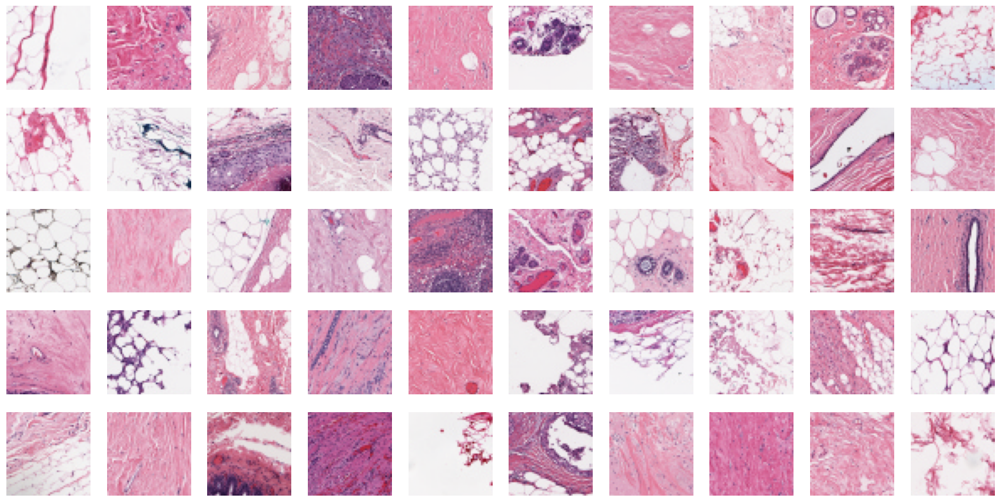

In [199]:

fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = healthy[m + 10*n]  # Index of the sample to display
        image_path = dataset.loc[idx, "path"]  # Get the path of the image
        image = imread(image_path)  # Load the image
        ax[n, m].imshow(image)  # Display the image
        ax[n, m].axis('off')  # Hide the axes

plt.show()

## Cancer Patches

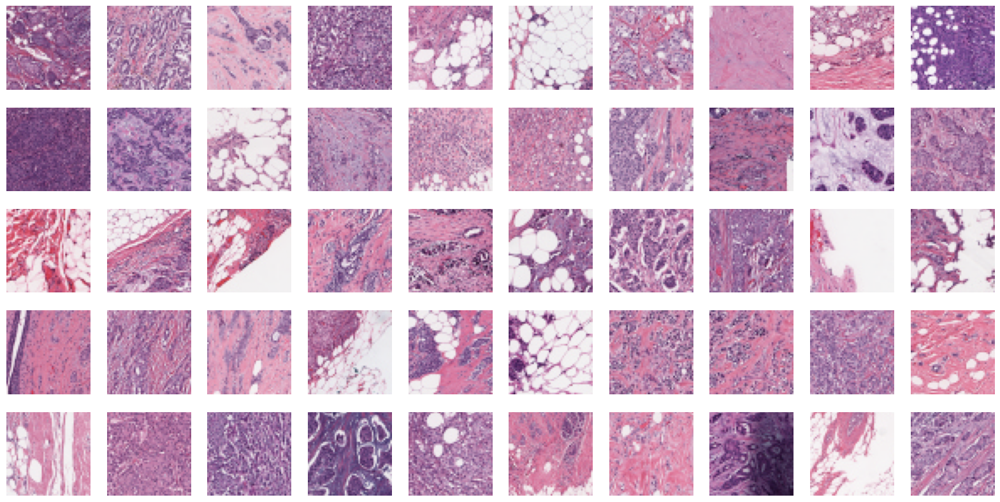

In [200]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = non_healthy[m + 10*n]  # Index of the sample to display
        image_path = dataset.loc[idx, "path"]  # Get the path of the image
        image = imread(image_path)  # Load the image
        ax[n, m].imshow(image)  # Display the image
        ax[n, m].axis('off')  # Hide the axes

plt.show()

So far we have looked at each patch of the breast, now let us attempt to visualize the entire breast tissue.

In [201]:
import pandas as pd
import numpy as np

def extract_coords(df):
    # Create a copy of the DataFrame to avoid SettingWithCopyWarning
    df_copy = df.copy()
    
    # Extract the x and y coordinates from the file paths
    coord = df_copy['path'].str.rsplit("_", n=4, expand=True)
    coord = coord.drop([0, 1, 4], axis=1)  # Drop unused parts
    coord = coord.rename({2: "x", 3: "y"}, axis=1)  # Rename columns to 'x' and 'y'
    coord['x'] = coord['x'].str.replace("x", "", case=False).astype(int)  # Convert x values to integers
    coord['y'] = coord['y'].str.replace("y", "", case=False).astype(int)  # Convert y values to integers
    
    # Merge the coordinates back into the original DataFrame using .loc to avoid SettingWithCopyWarning
    df_copy.loc[:, 'x'] = coord['x']
    df_copy.loc[:, 'y'] = coord['y']
    
    return df_copy

def get_patient_dataframe(patient_id, dataset):
    # Filter the dataset for the given patient_id
    patient_df = dataset[dataset['patient_id'] == patient_id].copy()
    
    # Extract coordinates and targets
    patient_df = extract_coords(patient_df)
    
    return patient_df


In [202]:
get_patient_dataframe("10253", dataset).head()

,patient_id,path,target,x,y
0,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1001
1,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1051
2,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1101
3,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1151
4,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1201


Binary target visualisation per tissue slice

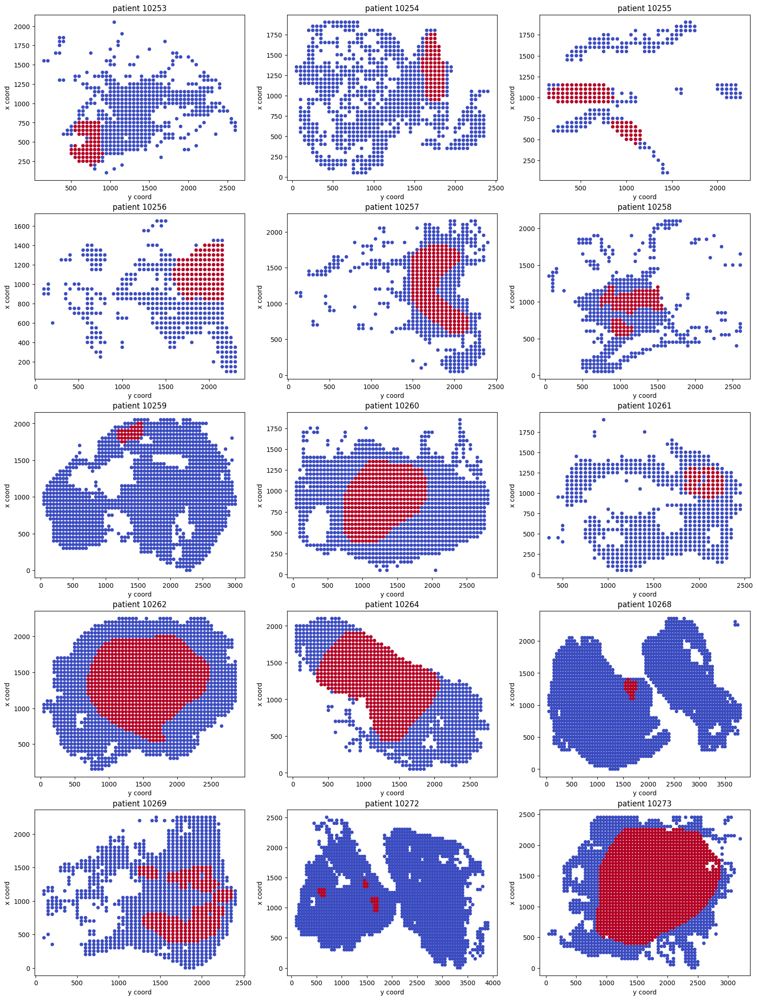

In [203]:

fig, ax = plt.subplots(5, 3, figsize=(20, 27))

# Get unique patient IDs from your dataset
patient_ids = dataset.patient_id.unique()

for n in range(5):
    for m in range(3):
        patient_id = patient_ids[m + 3*n]  # Select patient ID
        example_df = get_patient_dataframe(patient_id, dataset)  # Get the DataFrame for this patient
        
        # Plot scatter plot of x-y coordinates colored by target
        ax[n, m].scatter(example_df.x.values, example_df.y.values, c=example_df.target.values, cmap="coolwarm", s=20)
        ax[n, m].set_title("patient " + patient_id)
        ax[n, m].set_xlabel("y coord")
        ax[n, m].set_ylabel("x coord")

Insights
Sometimes we don't have the full tissue information. It seems that tissue patches have been discarded or lost during preparation.
Reading the paper (link!) that seems to be related to this data this could also be part of the preprocessing.

Visualising the breast tissue images 
Ok, now it's time to go one step deeper with our EDA. Given the coordinates of image patches we could try to reconstruct the whole tissue image (not only the targets).

In [204]:
def visualise_breast_tissue(patient_id, pred_df=None):
    example_df = get_patient_dataframe(patient_id, dataset)
    max_point = [example_df.y.max() - 1, example_df.x.max() - 1]
    grid = 255 * np.ones(shape=(max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    mask = 255 * np.ones(shape=(max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    

    if pred_df is not None:
        patient_df = pred_df[pred_df['patient_id'] == patient_id].copy()
    mask_proba = np.zeros(shape=(max_point[0] + 50, max_point[1] + 50, 1)).astype(float)

    broken_patches = []
    for n in range(len(example_df)):
        try:
            image = imread(example_df.path.values[n])
            # Convert the image from normalized floats to uint8
            image = (image * 255).astype(np.uint8)

            target = example_df.target.values[n]
            
            x_coord, y_coord = int(example_df.x.values[n]), int(example_df.y.values[n])
            x_start, y_start = x_coord - 1, y_coord - 1
            x_end, y_end = x_start + 50, y_start + 50

            grid[y_start:y_end, x_start:x_end] = image
           
            if target == 1:
                mask[y_start:y_end, x_start:x_end, 0] = 250
                mask[y_start:y_end, x_start:x_end, 1] = 0
                mask[y_start:y_end, x_start:x_end, 2] = 0
            if pred_df is not None:
                proba = patient_df[(patient_df['x'] == x_coord) & (patient_df['y'] == y_coord)]['proba']
                mask_proba[y_start:y_end, x_start:x_end, 0] = float(proba)

        except ValueError:
            broken_patches.append(example_df.iloc[n]['path'])

    return grid, mask, broken_patches, mask_proba

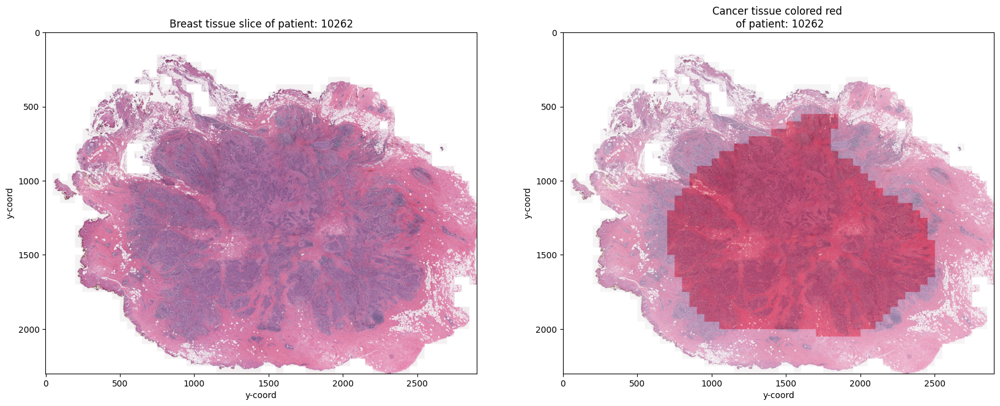

In [205]:
patient_id = '10262'
grid, mask, broken_patches, mask_proba = visualise_breast_tissue(patient_id)

fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[0].grid(False)
ax[1].grid(False)
for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")
ax[0].set_title("Breast tissue slice of patient: " + patient_id)
ax[1].set_title("Cancer tissue colored red \n of patient: " + patient_id);


# Splitting the Data

In [206]:
dataset

,patient_id,path,target
0,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
1,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
2,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
3,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
4,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
...,...,...,...
277519,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1
277520,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1
277521,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1
277522,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1


In [207]:
# Separate the dataset into two based on the target value
class_0_df = dataset[dataset['target'] == 0]
class_1_df = dataset[dataset['target'] == 1]

# Sample 2500 instances from each class
class_0_sample = class_0_df.sample(78786, random_state=42)
class_1_sample = class_1_df.sample(78786, random_state=42)

# Concatenate the two samples to create a balanced smaller dataset
small_dataset = pd.concat([class_0_sample, class_1_sample])

# Shuffle the small_dataset to mix class_0 and class_1 samples
small_dataset = small_dataset.sample(frac=1, random_state=42).reset_index(drop=True)


In [208]:
X = small_dataset.drop(columns=['target'])
y = small_dataset['target'].astype(str)
y = pd.DataFrame(y)

In [209]:
# show the rgb values of the images

In [210]:
from sklearn.model_selection import train_test_split

# First, split into train and temp (temp will be further split into validation and test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)

# Now split the temp set into validation and test
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


In [211]:
train_df = pd.concat([X_train, y_train], axis=1)
val_df = pd.concat([X_val, y_val], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

In [212]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# train_datagen = ImageDataGenerator(
#     # rescale=1./255,
#     horizontal_flip=True,
#     vertical_flip=True,
#     # Add other transformations here
# )

train_datagen = ImageDataGenerator(
    rescale=1./255,
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=False,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=False,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    rotation_range=20,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
    horizontal_flip=True,  # randomly flip images
    vertical_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)


In [213]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(180,180))

valid_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(180,180))

test_generator = val_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(180,180))

Found 110300 validated image filenames belonging to 2 classes.
Found 23636 validated image filenames belonging to 2 classes.
Found 23636 validated image filenames belonging to 2 classes.


In [276]:
test_generator = val_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=False,
    class_mode="categorical",
    target_size=(180,180))

Found 23636 validated image filenames belonging to 2 classes.


In [214]:
# Fetch the first batch of images and labels
images, labels = next(train_generator)

# Inspect the first image in the batch
first_image = images[0]

# Check the maximum and minimum values
max_value = first_image.max()
min_value = first_image.min()

print(f"Maximum pixel value: {max_value}")
print(f"Minimum pixel value: {min_value}")

images

Maximum pixel value: 0.9764706492424011
Minimum pixel value: 0.21176472306251526


array([[[[0.8313726 , 0.5411765 , 0.63529414],
         [0.8313726 , 0.5411765 , 0.63529414],
         [0.8313726 , 0.5411765 , 0.63529414],
         ...,
         [0.94117653, 0.9450981 , 0.9568628 ],
         [0.94406515, 0.9450981 , 0.9568628 ],
         [0.9469896 , 0.9450981 , 0.9568628 ]],

        [[0.8313726 , 0.5411765 , 0.63529414],
         [0.8313726 , 0.5411765 , 0.63529414],
         [0.8313726 , 0.5411765 , 0.63529414],
         ...,
         [0.9525361 , 0.9450981 , 0.9568628 ],
         [0.95294124, 0.9450981 , 0.9568628 ],
         [0.95294124, 0.9450981 , 0.9568628 ]],

        [[0.8313726 , 0.5411765 , 0.63529414],
         [0.8313726 , 0.5411765 , 0.63529414],
         [0.8313726 , 0.5411765 , 0.63529414],
         ...,
         [0.95294124, 0.9450981 , 0.9568628 ],
         [0.95294124, 0.9450981 , 0.9568628 ],
         [0.95294124, 0.9450981 , 0.9568628 ]],

        ...,

        [[0.92549026, 0.79215693, 0.85098046],
         [0.92549026, 0.79215693, 0.85098046]

In [215]:
# from imblearn.over_sampling import RandomOverSampler

# ros = RandomOverSampler(random_state=42)
# X_res, y_res = ros.fit_resample(X.reshape(X.shape[0], -1), y)  # Reshape X to 2D for resampling
# X_res = X_res.reshape(-1, 50, 50, 3)  # Reshape X back to its original shape


# Modelling

In [216]:
# import conv2d, maxpooling2d, flatten, dense, dropout
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(180, 180, 3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

model.compile(loss=keras.losses.categorical_crossentropy,
    optimizer=keras.optimizers.Adadelta(),
    metrics=['accuracy'])

In [217]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 178, 178, 32)      896       
                                                                 
 conv2d_7 (Conv2D)           (None, 176, 176, 64)      18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 88, 88, 64)       0         
 2D)                                                             
                                                                 
 dropout_14 (Dropout)        (None, 88, 88, 64)        0         
                                                                 
 flatten_9 (Flatten)         (None, 495616)            0         
                                                                 
 dense_18 (Dense)            (None, 128)               63438976  
                                                      

In [218]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/convnet_from_scratch_with_augmentation.keras",
        save_best_only=True,
        monitor="val_loss")
]

history = model.fit(
    train_generator,
    batch_size=1024,
    epochs=8,
    validation_data=valid_generator,
    callbacks=callbacks)


Epoch 1/8


3447/3447 [==============================] - 643s 186ms/step - loss: 0.5428 - accuracy: 0.7374 - val_loss: 0.4756 - val_accuracy: 0.7891
Epoch 2/8
3447/3447 [==============================] - 598s 173ms/step - loss: 0.4947 - accuracy: 0.7796 - val_loss: 0.4714 - val_accuracy: 0.7899
Epoch 3/8
3447/3447 [==============================] - 611s 177ms/step - loss: 0.4854 - accuracy: 0.7855 - val_loss: 0.4615 - val_accuracy: 0.7969
Epoch 4/8
3447/3447 [==============================] - 615s 178ms/step - loss: 0.4807 - accuracy: 0.7882 - val_loss: 0.4595 - val_accuracy: 0.7976
Epoch 5/8
3447/3447 [==============================] - 599s 174ms/step - loss: 0.4769 - accuracy: 0.7896 - val_loss: 0.4583 - val_accuracy: 0.7979
Epoch 6/8
3447/3447 [==============================] - 592s 172ms/step - loss: 0.4751 - accuracy: 0.7912 - val_loss: 0.4566 - val_accuracy: 0.7995
Epoch 7/8
3447/3447 [==============================] - 601s 174ms/step - loss: 0.4720 - accuracy: 0.7915 - val_loss: 0.4515 - va

In [268]:
history_df = pd.DataFrame(history.history)
history_df.insert(0, 'epoch', range(1, len(history_df) + 1))
history_df

,epoch,loss,accuracy,val_loss,val_accuracy
0,1,0.542761,0.737353,0.475618,0.789051
1,2,0.494709,0.779556,0.471389,0.789854
2,3,0.485370,0.785494,0.461452,0.796920
3,4,0.480675,0.788196,0.459515,0.797597
4,5,0.476892,0.789637,0.458342,0.797851
5,6,0.475120,0.791160,0.456600,0.799543
6,7,0.472008,0.791469,0.451499,0.800093
7,8,0.471177,0.792004,0.450510,0.800178


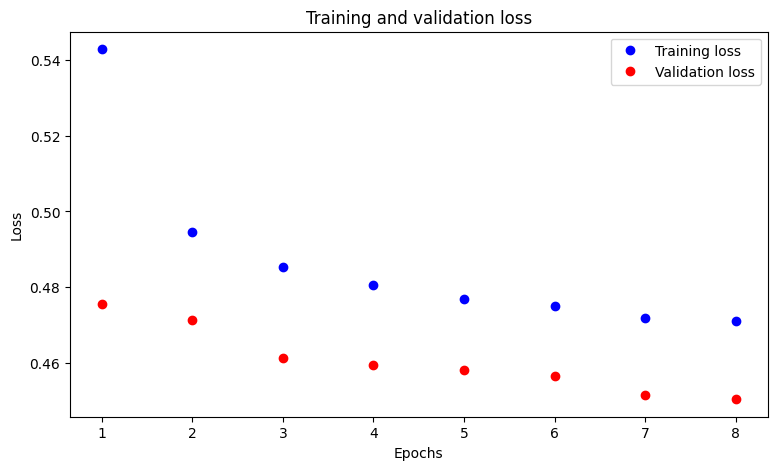

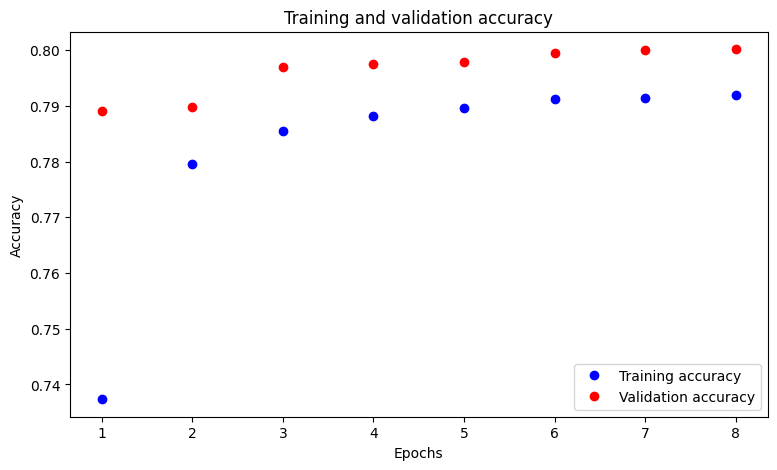

In [269]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Plot the training and validation loss
plt.figure(figsize=(9, 5))
values = history_df['accuracy']
epochs = range(1, len(values) + 1)
plt.plot(epochs, history_df['loss'], 'bo', label='Training loss')
plt.plot(epochs, history_df['val_loss'], 'ro', label='Validation loss')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Loss')
plt.legend()
plt.title('Training and validation loss')
plt.show()

# Plot the training and validation accuracy
plt.figure(figsize=(9, 5))
plt.plot(epochs, history_df['accuracy'], 'bo', label='Training accuracy')
plt.plot(epochs, history_df['val_accuracy'], 'ro', label='Validation accuracy')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and validation accuracy')
plt.show()

In [277]:
# evaluate the model
model.evaluate(test_generator)

739/739 [==============================] - 20s 27ms/step - loss: 0.4561 - accuracy: 0.7946


[0.45607948303222656, 0.7946352958679199]

  1/739 [..............................] - ETA: 49s

739/739 [==============================] - 20s 28ms/step
              precision    recall  f1-score   support

           0       0.80      0.78      0.79     11874
           1       0.79      0.81      0.80     11762

    accuracy                           0.79     23636
   macro avg       0.79      0.79      0.79     23636
weighted avg       0.79      0.79      0.79     23636



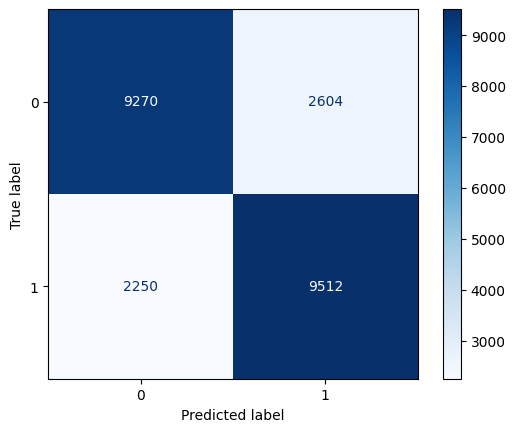

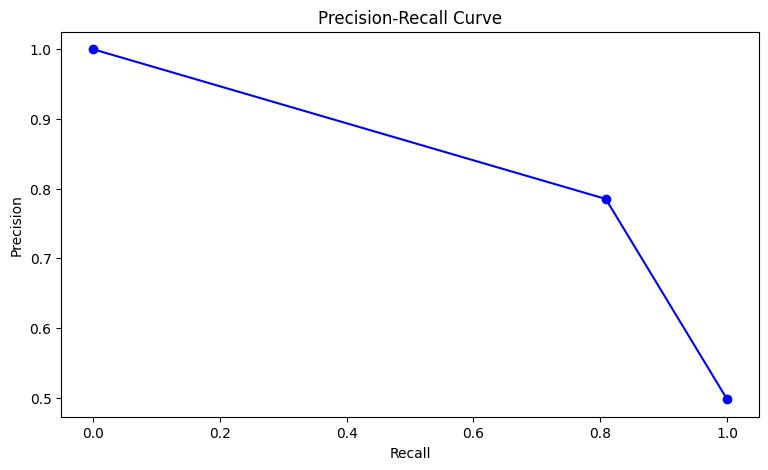

F1 Score: 0.7967166429349192
Accuracy: 0.7946353020815705
Precision: 0.7850775833608452
Recall: 0.8087060023805476


In [278]:
# predict the model
y_pred = model.predict(test_generator)

# get the class with the highest probability
y_pred = np.argmax(y_pred, axis=1)

# get the true class
y_true = test_generator.classes

# get the class labels
class_labels = list(test_generator.class_indices.keys())

# get the classification report
print(classification_report(y_true, y_pred, target_names=class_labels))

# get the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap='Blues')

# get the precision recall curve
precision, recall, _ = precision_recall_curve(y_true, y_pred)

# plot the precision recall curve
plt.figure(figsize=(9, 5))
plt.plot(recall, precision, marker='o', color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# get the f1 score
f1 = f1_score(y_true, y_pred)
print(f'F1 Score: {f1}')

# get the accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f'Accuracy: {accuracy}')

# get the precision
precision = precision_score(y_true, y_pred)
print(f'Precision: {precision}')

# get the recall
recall = recall_score(y_true, y_pred)
print(f'Recall: {recall}')

#from the confusion matrix, calculate tn, fp, fn, tp
tn, fp, fn, tp = cm.ravel()
print(f'True Negatives: {tn}')
print(f'False Positives: {fp}')
print(f'False Negatives: {fn}')
print(f'True Positives: {tp}')

# calculate the specificity
specificity = tn / (tn + fp)
print(f'Specificity: {specificity}')




In [271]:
model.evaluate(test_generator)

739/739 [==============================] - 20s 27ms/step - loss: 0.4561 - accuracy: 0.7946


[0.45607972145080566, 0.7946352958679199]

In [219]:
images, labels = next(train_generator)

In [220]:
# Inspect the first image in the batch
first_image = images[0]

# Check the maximum and minimum values
max_value = first_image.max()
min_value = first_image.min()

print(f"Maximum pixel value: {max_value}")
print(f"Minimum pixel value: {min_value}")

Maximum pixel value: 0.9725490808486938
Minimum pixel value: 0.5333333611488342


VGG 16

In [254]:
conv_base = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(180, 180, 3)
    )

In [255]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [256]:
conv_base.trainable = False
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [257]:
inputs = keras.Input(shape=(180, 180, 3))
x = keras.applications.vgg16.preprocess_input(inputs)
x = conv_base(x)
x = layers.Dropout(0.25)(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(2, activation="softmax")(x)
model_vgg = keras.Model(inputs, outputs)

In [258]:
model_vgg.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 tf.__operators__.getitem_9   (None, 180, 180, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_9 (TFOpLambd  (None, 180, 180, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 dropout_22 (Dropout)        (None, 5, 5, 512)         0         
                                                                 
 flatten_13 (Flatten)        (None, 12800)             0   

In [259]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [260]:
conv_base.trainable = True
for layer in conv_base.layers[:-4]:
    layer.trainable = False

In [261]:
model_vgg.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 tf.__operators__.getitem_9   (None, 180, 180, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_9 (TFOpLambd  (None, 180, 180, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 dropout_22 (Dropout)        (None, 5, 5, 512)         0         
                                                                 
 flatten_13 (Flatten)        (None, 12800)             0   

In [262]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [263]:
model_vgg.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 tf.__operators__.getitem_9   (None, 180, 180, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_9 (TFOpLambd  (None, 180, 180, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 dropout_22 (Dropout)        (None, 5, 5, 512)         0         
                                                                 
 flatten_13 (Flatten)        (None, 12800)             0   

In [264]:
model_vgg.compile(loss="categorical_crossentropy",
              optimizer=keras.optimizers.Adadelta(),
              metrics=["accuracy"])

callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/finetune-vgg16.keras",
        save_best_only=True,
        monitor="val_loss")
]
history_vgg = model_vgg.fit(
    train_generator,
    epochs=30,
    batch_size=1024,
    validation_data=valid_generator,
    callbacks=callbacks)

Epoch 1/30
  14/3447 [..............................] - ETA: 7:59 - loss: 1.5627 - accuracy: 0.5424

3447/3447 [==============================] - 649s 188ms/step - loss: 0.7689 - accuracy: 0.5350 - val_loss: 0.6613 - val_accuracy: 0.6381
Epoch 2/30
3447/3447 [==============================] - 695s 202ms/step - loss: 0.6585 - accuracy: 0.6152 - val_loss: 0.6267 - val_accuracy: 0.6638
Epoch 3/30
3447/3447 [==============================] - 683s 198ms/step - loss: 0.6332 - accuracy: 0.6489 - val_loss: 0.6100 - val_accuracy: 0.6713
Epoch 4/30
3447/3447 [==============================] - 707s 205ms/step - loss: 0.6150 - accuracy: 0.6681 - val_loss: 0.5885 - val_accuracy: 0.6942
Epoch 5/30
3447/3447 [==============================] - 824s 239ms/step - loss: 0.6021 - accuracy: 0.6804 - val_loss: 0.5785 - val_accuracy: 0.7001
Epoch 6/30
3447/3447 [==============================] - 934s 271ms/step - loss: 0.5940 - accuracy: 0.6878 - val_loss: 0.5761 - val_accuracy: 0.7022
Epoch 7/30
3447/3447 [==============================] - 936s 271ms/step - loss: 0.5872 - accuracy: 0.6934 - val_loss: 0.583

In [266]:
history_df_vgg = pd.DataFrame(history_vgg.history)
history_df_vgg.insert(0, 'epoch', range(1, len(history_df_vgg) + 1))
history_df_vgg

,epoch,loss,accuracy,val_loss,val_accuracy
0,1,0.768852,0.534968,0.661330,0.638137
1,2,0.658532,0.615222,0.626669,0.663818
2,3,0.633195,0.648876,0.610023,0.671264
3,4,0.614975,0.668087,0.588496,0.694195
4,5,0.602072,0.680381,0.578502,0.700118
5,6,0.594014,0.687770,0.576064,0.702192
6,7,0.587167,0.693427,0.583505,0.694872
7,8,0.583271,0.698024,0.568290,0.708834
8,9,0.579839,0.700091,0.564396,0.712092
9,10,0.577093,0.703046,0.680026,0.626587


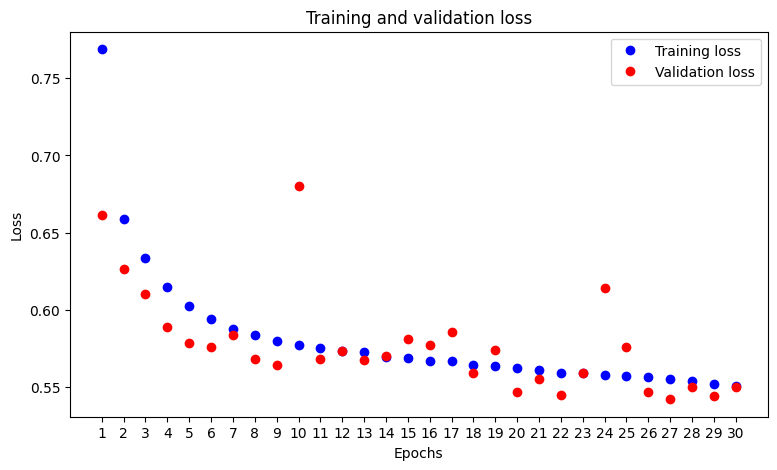

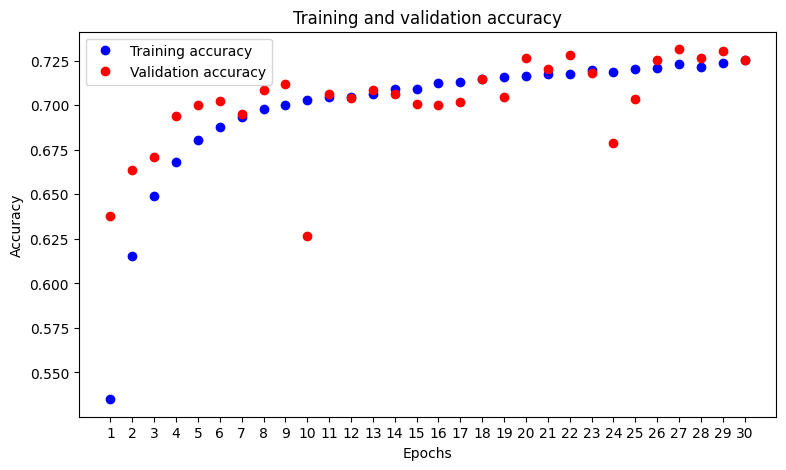

In [267]:
# Plot the training and validation loss
plt.figure(figsize=(9, 5))
values = history_df_vgg['accuracy']
epochs = range(1, len(values) + 1)
plt.plot(epochs, history_df_vgg['loss'], 'bo', label='Training loss')
plt.plot(epochs, history_df_vgg['val_loss'], 'ro', label='Validation loss')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Loss')
plt.legend()
plt.title('Training and validation loss')
plt.show()

# Plot the training and validation accuracy
plt.figure(figsize=(9, 5))
plt.plot(epochs, history_df_vgg['accuracy'], 'bo', label='Training accuracy')
plt.plot(epochs, history_df_vgg['val_accuracy'], 'ro', label='Validation accuracy')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and validation accuracy')
plt.show()

739/739 [==============================] - 44s 59ms/step
              precision    recall  f1-score   support

           0       0.78      0.61      0.69     11874
           1       0.68      0.83      0.75     11762

    accuracy                           0.72     23636
   macro avg       0.73      0.72      0.72     23636
weighted avg       0.73      0.72      0.72     23636



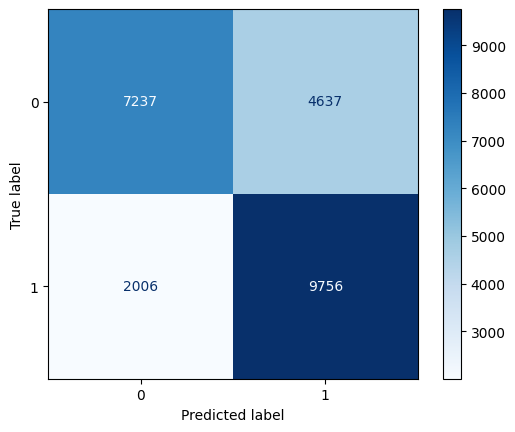

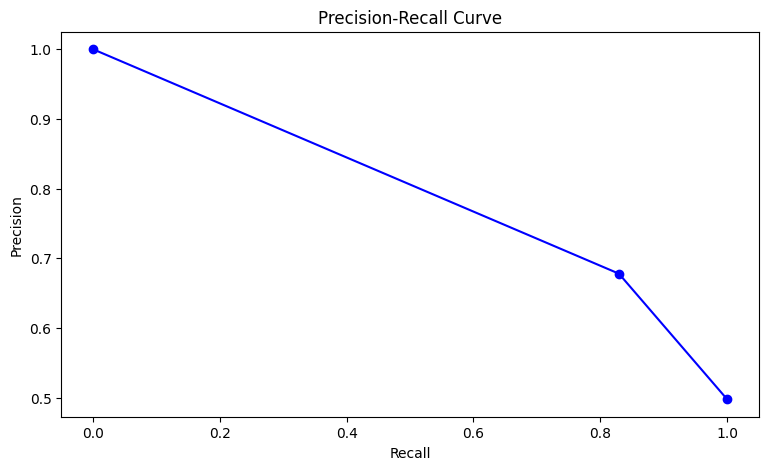

F1 Score: 0.7967166429349192
Accuracy: 0.7189456760873244
Precision: 0.6778295004516084
Recall: 0.829450773677946
True Negatives: 9270
False Positives: 2604
False Negatives: 2250
True Positives: 9512
Specificity: 0.7806973218797373


In [279]:
# predict the model
y_pred_vgg = model_vgg.predict(test_generator)

# get the class with the highest probability
y_pred_vgg = np.argmax(y_pred_vgg, axis=1)

# get the true class
y_true = test_generator.classes

# get the class labels
class_labels = list(test_generator.class_indices.keys())

# get the classification report
print(classification_report(y_true, y_pred_vgg, target_names=class_labels))

# get the confusion matrix
cm_vgg = confusion_matrix(y_true, y_pred_vgg)

# plot the confusion matrix
disp_vgg = ConfusionMatrixDisplay(confusion_matrix=cm_vgg, display_labels=class_labels)
disp_vgg.plot(cmap='Blues')

# get the precision recall curve
precision_vgg, recall_vgg, _ = precision_recall_curve(y_true, y_pred_vgg)

# plot the precision recall curve
plt.figure(figsize=(9, 5))
plt.plot(recall_vgg, precision_vgg, marker='o', color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# get the f1 score
f1_vgg = f1_score(y_true, y_pred_vgg)
print(f'F1 Score: {f1}')

# get the accuracy
accuracy_vgg = accuracy_score(y_true, y_pred_vgg)
print(f'Accuracy: {accuracy_vgg}')

# get the precision
precision_vgg = precision_score(y_true, y_pred_vgg)
print(f'Precision: {precision_vgg}')

# get the recall
recall_vgg = recall_score(y_true, y_pred_vgg)
print(f'Recall: {recall_vgg}')

#from the confusion matrix, calculate tn, fp, fn, tp
tn_vgg, fp_vgg, fn_vgg, tp_vgg = cm.ravel()
print(f'True Negatives: {tn_vgg}')
print(f'False Positives: {fp_vgg}')
print(f'False Negatives: {fn_vgg}')
print(f'True Positives: {tp_vgg}')

# calculate the specificity
specificity_vgg = tn_vgg / (tn_vgg + fp_vgg)
print(f'Specificity: {specificity_vgg}')


